In [235]:
import numpy as np
import pandas as pd

from sklearn.feature_selection import RFE
from sklearn.ensemble import ExtraTreesRegressor


import matplotlib.pyplot as plt
from pandas.plotting import scatter_matrix


from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.metrics import explained_variance_score
from sklearn.metrics import mean_absolute_error


from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.utils import np_utils
from keras.constraints import maxnorm
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

seed = 7
numpy.random.seed(seed)

In [237]:
fires = pd.read_csv("/Users/abc/Documents/Repos/ML/Data/forestfires.csv")

In [239]:
fires

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00


In [241]:
fires.head()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0


In [243]:
fires.month.replace(('jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec'),(1,2,3,4,5,6,7,8,9,10,11,12), inplace=True)
fires.day.replace(('mon','tue','wed','thu','fri','sat','sun'),(1,2,3,4,5,6,7), inplace=True)

In [245]:
fires.describe

<bound method NDFrame.describe of      X  Y  month  day  FFMC    DMC     DC   ISI  temp  RH  wind  rain   area
0    7  5      3    5  86.2   26.2   94.3   5.1   8.2  51   6.7   0.0   0.00
1    7  4     10    2  90.6   35.4  669.1   6.7  18.0  33   0.9   0.0   0.00
2    7  4     10    6  90.6   43.7  686.9   6.7  14.6  33   1.3   0.0   0.00
3    8  6      3    5  91.7   33.3   77.5   9.0   8.3  97   4.0   0.2   0.00
4    8  6      3    7  89.3   51.3  102.2   9.6  11.4  99   1.8   0.0   0.00
..  .. ..    ...  ...   ...    ...    ...   ...   ...  ..   ...   ...    ...
512  4  3      8    7  81.6   56.7  665.6   1.9  27.8  32   2.7   0.0   6.44
513  2  4      8    7  81.6   56.7  665.6   1.9  21.9  71   5.8   0.0  54.29
514  7  4      8    7  81.6   56.7  665.6   1.9  21.2  70   6.7   0.0  11.16
515  1  4      8    6  94.4  146.0  614.7  11.3  25.6  42   4.0   0.0   0.00
516  6  3     11    2  79.5    3.0  106.7   1.1  11.8  31   4.5   0.0   0.00

[517 rows x 13 columns]>

In [247]:
dataset = fires.values


X = dataset[:,0:12]
Y = dataset[:,12]

In [249]:
model = ExtraTreesRegressor()
rfe = RFE(model, 3)
fit = rfe.fit(X, Y)

print("Number of Features: ", fit.n_features_)
print("Selected Features: ", fit.support_)
print("Feature Ranking: ", fit.ranking_) 

/usr/local/anaconda3/lib/python3.8/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass n_features_to_select=3 as keyword args. From version 1.0 (renaming of 0.25) passing these as positional arguments will result in an error
  warnings.warn(f"Pass {args_msg} as keyword args. From version "
Number of Features:  3
Selected Features:  [False False False False False  True  True False  True False False False]
Feature Ranking:  [ 7  5  9  4  6  1  1  8  1  2  3 10]


(array([508.,   6.,   1.,   0.,   0.,   0.,   1.,   0.,   0.,   1.]),
 array([   0.   ,  109.084,  218.168,  327.252,  436.336,  545.42 ,
         654.504,  763.588,  872.672,  981.756, 1090.84 ]),
 <BarContainer object of 10 artists>)

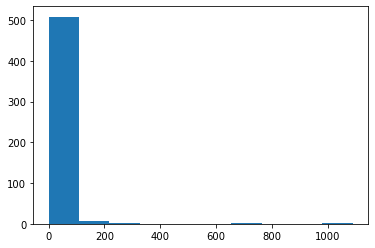

In [251]:
plt.hist((fires.area))

In [ ]:
fires.hist()

array([[<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>],
       [<AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>,
        <AxesSubplot:ylabel='Density'>, <AxesSubplot:ylabel='Density'>]],
      dtype=object)

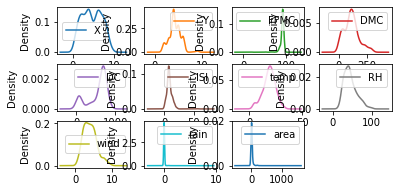

In [240]:
fires.plot(kind='density', subplots=True, layout=(4,4), sharex=False, sharey=False)

X           AxesSubplot(0.125,0.71587;0.168478x0.16413)
Y        AxesSubplot(0.327174,0.71587;0.168478x0.16413)
FFMC     AxesSubplot(0.529348,0.71587;0.168478x0.16413)
DMC      AxesSubplot(0.731522,0.71587;0.168478x0.16413)
DC         AxesSubplot(0.125,0.518913;0.168478x0.16413)
ISI     AxesSubplot(0.327174,0.518913;0.168478x0.16413)
temp    AxesSubplot(0.529348,0.518913;0.168478x0.16413)
RH      AxesSubplot(0.731522,0.518913;0.168478x0.16413)
wind       AxesSubplot(0.125,0.321957;0.168478x0.16413)
rain    AxesSubplot(0.327174,0.321957;0.168478x0.16413)
area    AxesSubplot(0.529348,0.321957;0.168478x0.16413)
dtype: object

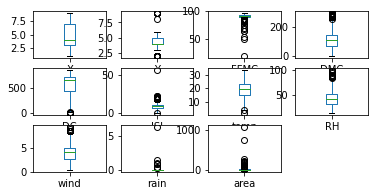

In [242]:
fires.plot(kind='box', subplots=True, layout=(4,4), sharex=False, sharey=False)

array([[<AxesSubplot:xlabel='X', ylabel='X'>,
        <AxesSubplot:xlabel='Y', ylabel='X'>,
        <AxesSubplot:xlabel='month', ylabel='X'>,
        <AxesSubplot:xlabel='day', ylabel='X'>,
        <AxesSubplot:xlabel='FFMC', ylabel='X'>,
        <AxesSubplot:xlabel='DMC', ylabel='X'>,
        <AxesSubplot:xlabel='DC', ylabel='X'>,
        <AxesSubplot:xlabel='ISI', ylabel='X'>,
        <AxesSubplot:xlabel='temp', ylabel='X'>,
        <AxesSubplot:xlabel='RH', ylabel='X'>,
        <AxesSubplot:xlabel='wind', ylabel='X'>,
        <AxesSubplot:xlabel='rain', ylabel='X'>,
        <AxesSubplot:xlabel='area', ylabel='X'>],
       [<AxesSubplot:xlabel='X', ylabel='Y'>,
        <AxesSubplot:xlabel='Y', ylabel='Y'>,
        <AxesSubplot:xlabel='month', ylabel='Y'>,
        <AxesSubplot:xlabel='day', ylabel='Y'>,
        <AxesSubplot:xlabel='FFMC', ylabel='Y'>,
        <AxesSubplot:xlabel='DMC', ylabel='Y'>,
        <AxesSubplot:xlabel='DC', ylabel='Y'>,
        <AxesSubplot:xlabel='ISI', ylabe

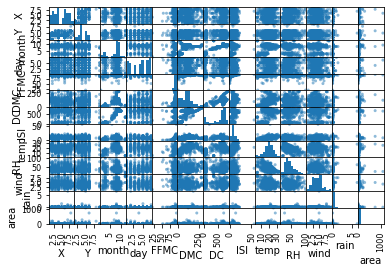

In [244]:
scatter_matrix(fires)

[Text(0, 0, 'X'),
 Text(0, 1, 'Y'),
 Text(0, 2, 'month'),
 Text(0, 3, 'day'),
 Text(0, 4, 'FFMC'),
 Text(0, 5, 'DMC'),
 Text(0, 6, 'DC'),
 Text(0, 7, 'ISI'),
 Text(0, 8, 'temp'),
 Text(0, 9, 'RH'),
 Text(0, 10, 'wind'),
 Text(0, 11, 'rain'),
 Text(0, 12, 'area')]

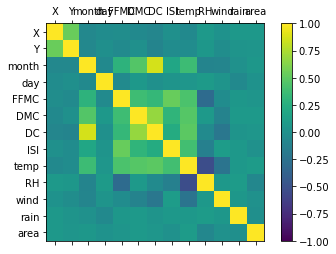

In [246]:
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(fires.corr(), vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = numpy.arange(0,13,1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(fires.columns)
ax.set_yticklabels(fires.columns)

In [248]:
num_instances = len(X)

models = []
models.append(('LiR', LinearRegression()))
models.append(('Ridge', Ridge()))
models.append(('Lasso', Lasso()))
models.append(('ElasticNet', ElasticNet()))
models.append(('Bag_Re', BaggingRegressor()))
models.append(('RandomForest', RandomForestRegressor()))
models.append(('ExtraTreesRegressor', ExtraTreesRegressor()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('CART', DecisionTreeRegressor()))
models.append(('SVM', SVR()))

# Evaluations
results = []
names = []
scoring = []

for name, model in models:
    # Fit the model
    model.fit(X, Y)
    
    predictions = model.predict(X)
    
    # Evaluate the model
    score = explained_variance_score(Y, predictions)
    mae = mean_absolute_error(predictions, Y)
    # print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))
    results.append(mae)
    names.append(name)
    
    msg = "%s: %f (%f)" % (name, score, mae)
    print(msg)

LiR: 0.023975 (19.309939)
Ridge: 0.023975 (19.307816)
Lasso: 0.023297 (19.054901)
ElasticNet: 0.023187 (19.055855)
Bag_Re: 0.854364 (7.954127)
RandomForest: 0.830784 (8.037919)
ExtraTreesRegressor: 0.999897 (0.096441)
KNN: 0.273047 (15.507250)
CART: 0.999897 (0.096441)
SVM: 0.000503 (12.808832)


In [250]:
Y = numpy.array(Y).reshape((len(Y), 1))
#Y.reshape(-1, 1)

# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
Y = scaler.fit_transform(Y)

In [252]:
# define base model
def baseline_model():
    # create model
    model = Sequential()
    model.add(Dense(10, input_dim=12, kernel_initializer='uniform', activation='relu'))
    #model.add(Dropout(0.2))
    #model.add(Dense(5, kernel_initializer='uniform', activation='relu', kernel_constraint=maxnorm(3)))
    #model.add(Dropout(0.2))
    model.add(Dense(3, kernel_initializer='uniform', activation='relu'))
    model.add(Dense(1, kernel_initializer='uniform', activation='relu'))
    
    # compile model
    model.compile(loss='mean_squared_error', optimizer='adam')
    return model


# fix random seed for reproducibility
seed = 7
np.random.seed(seed)

# evaluate model with standardized dataset
estimator = KerasRegressor(build_fn=baseline_model, nb_epoch=600, batch_size=5, verbose=0)

kfold = KFold(n_splits=30, random_state=seed)
results = cross_val_score(estimator, X, Y, cv=kfold)
print("Results: %.2f (%.2f) MSE" % (results.mean(), results.std()))

ValueError: Setting a random_state has no effect since shuffle is False. You should leave random_state to its default (None), or set shuffle=True.